# **Monet Painting GAN Project**

## **Introduction**

This project explores the use of Generative Adversarial Networks (GANs) to transform photographs into images that mimic the style of the famous painter Claude Monet. GANs, a class of deep learning models, have gained significant attention for their ability to generate new data points that resemble a given dataset. In this project, we leverage this capability to create images that blend the real-world aesthetics of photos with the impressionistic style of Monet.

### **Objective**

The primary goal of this project is to build and train a GAN model that can successfully convert ordinary photographs into Monet-style paintings. The project is part of the Kaggle competition titled "Monet Painting Dataset," where participants are evaluated based on the quality of their generated images using the Memorization-informed Fréchet Inception Distance (MiFID) score.

### **Dataset Overview**

The dataset provided by the Kaggle competition consists of two main components:
1. **Monet Paintings:** A collection of images representing Monet's works, characterized by vibrant colors, bold brush strokes, and a unique impressionistic style.
2. **Photographs:** A set of real-world photographs that serve as the input to our GAN model, which we aim to transform into Monet-style paintings.


### **Project Outline**

1. **Exploratory Data Analysis (EDA):** We begin by exploring the dataset to understand its structure, characteristics, and any underlying patterns.
2. **Model Building:** Next, we construct and train a GAN model designed to perform the style transfer from photographs to Monet-style paintings.
3. **Evaluation:** The generated images are evaluated using the MiFID score, and we discuss the results in the context of the project's objectives.
4. **Conclusion:** Finally, we summarize our findings, discuss potential improvements, and highlight future directions for further exploration.

Through this project, we aim to gain hands-on experience with GANs and explore the fascinating intersection of art and technology.

In [1]:
import tensorflow as tf

# Configure TensorFlow to use the GPU and limit memory usage
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(f"{len(gpus)} Physical GPUs, {len(logical_gpus)} Logical GPUs")
    except RuntimeError as e:
        print(e)
else:
    print("No GPU found. Ensure your GPU drivers and CUDA are properly installed.")


1 Physical GPUs, 1 Logical GPUs


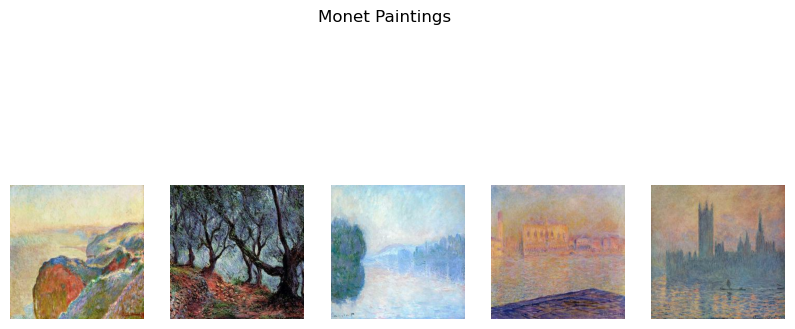

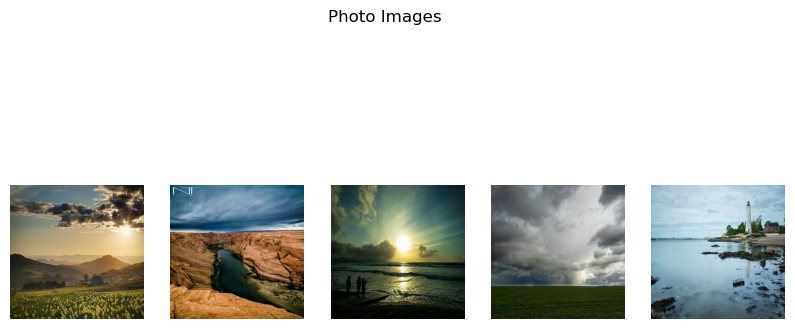

In [2]:
import os
import tensorflow as tf
import matplotlib.pyplot as plt

# Set the path to the dataset
data_dir = r"C:\Users\Shivam\Desktop\week5"

# Load and process an image using TensorFlow (which will utilize GPU)
def load_and_process_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)  # Convert to float32 for easier processing
    return image

# Display a few Monet paintings and photo images
def display_images(image_paths, title, num_images=5):
    plt.figure(figsize=(10, 5))
    for i, image_path in enumerate(image_paths[:num_images]):
        img_tensor = load_and_process_image(image_path)
        plt.subplot(1, num_images, i+1)
        plt.imshow(img_tensor)
        plt.axis('off')
    plt.suptitle(title)
    plt.show()

# Check the contents of the directory
monet_dir = os.path.join(data_dir, 'monet_jpg')
photo_dir = os.path.join(data_dir, 'photo_jpg')

monet_images = [os.path.join(monet_dir, img) for img in os.listdir(monet_dir)]
photo_images = [os.path.join(photo_dir, img) for img in os.listdir(photo_dir)]

# Display some images from each category
display_images(monet_images, "Monet Paintings")
display_images(photo_images, "Photo Images")


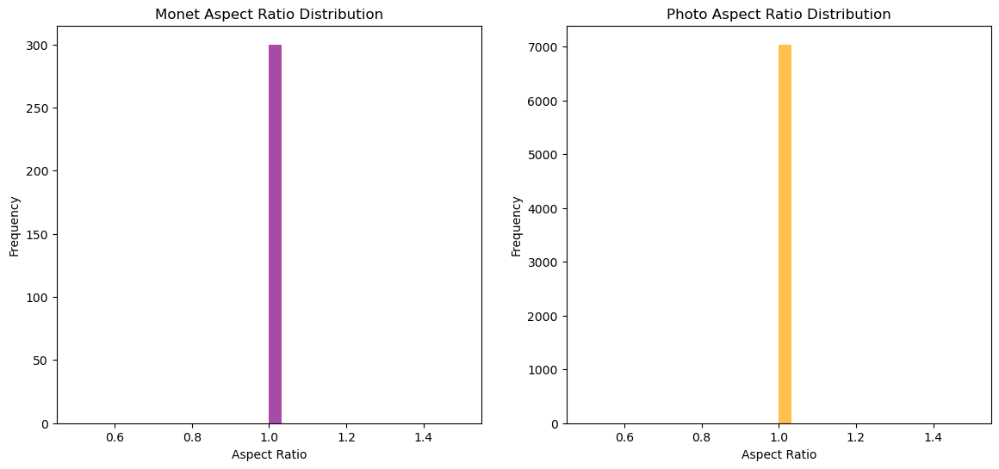

In [3]:
# Function to calculate aspect ratios using TensorFlow on GPU
def calculate_aspect_ratio(image_paths):
    aspect_ratios = []
    for image_path in image_paths:
        img_tensor = load_and_process_image(image_path)
        width = tf.shape(img_tensor)[1]
        height = tf.shape(img_tensor)[0]
        aspect_ratio = tf.divide(tf.cast(width, tf.float32), tf.cast(height, tf.float32))
        aspect_ratios.append(aspect_ratio.numpy())
    return aspect_ratios

# Calculate aspect ratios for Monet paintings and photo images
monet_aspect_ratios = calculate_aspect_ratio(monet_images)
photo_aspect_ratios = calculate_aspect_ratio(photo_images)

# Plot aspect ratio distributions
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.hist(monet_aspect_ratios, bins=30, color='purple', alpha=0.7)
plt.title("Monet Aspect Ratio Distribution")
plt.xlabel("Aspect Ratio")
plt.ylabel("Frequency")

plt.subplot(1, 2, 2)
plt.hist(photo_aspect_ratios, bins=30, color='orange', alpha=0.7)
plt.title("Photo Aspect Ratio Distribution")
plt.xlabel("Aspect Ratio")
plt.ylabel("Frequency")

plt.show()


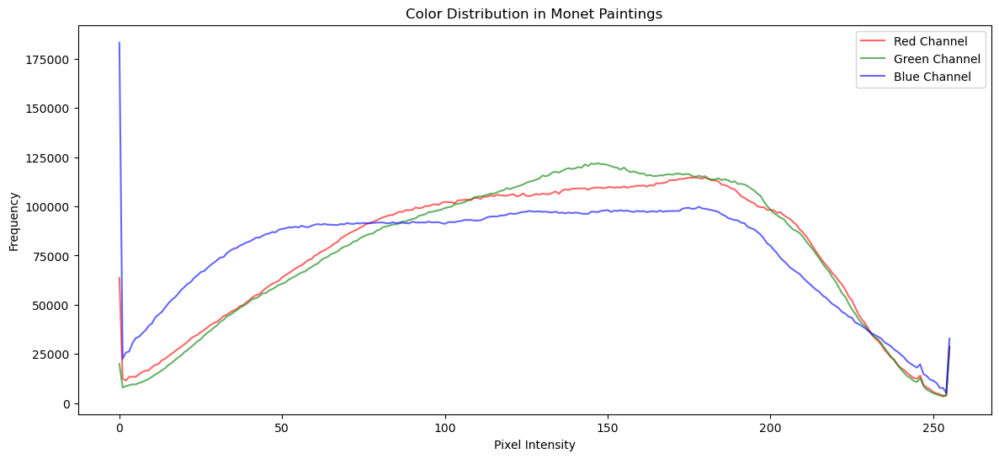

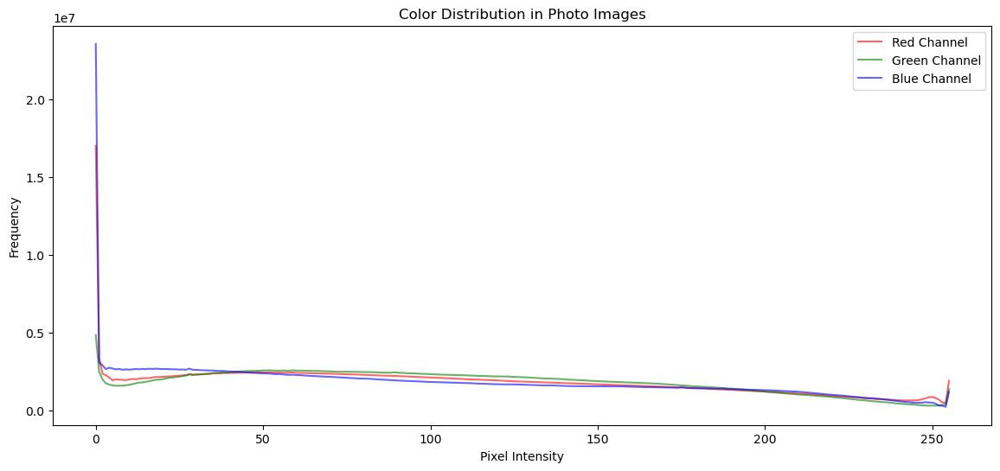

In [4]:
import tensorflow as tf
import numpy as np

# Function to compute color distribution in batches to avoid high RAM usage
def compute_color_histograms(image_paths, batch_size=10):
    r_hist = tf.zeros([256], dtype=tf.int32)
    g_hist = tf.zeros([256], dtype=tf.int32)
    b_hist = tf.zeros([256], dtype=tf.int32)
    
    for i in range(0, len(image_paths), batch_size):
        batch_paths = image_paths[i:i+batch_size]
        
        for image_path in batch_paths:
            img_tensor = load_and_process_image(image_path)
            r_channel = tf.cast(tf.reshape(img_tensor[:, :, 0] * 255, [-1]), tf.int32)
            g_channel = tf.cast(tf.reshape(img_tensor[:, :, 1] * 255, [-1]), tf.int32)
            b_channel = tf.cast(tf.reshape(img_tensor[:, :, 2] * 255, [-1]), tf.int32)
            
            r_hist += tf.histogram_fixed_width(r_channel, [0, 255], nbins=256)
            g_hist += tf.histogram_fixed_width(g_channel, [0, 255], nbins=256)
            b_hist += tf.histogram_fixed_width(b_channel, [0, 255], nbins=256)
    
    return r_hist.numpy(), g_hist.numpy(), b_hist.numpy()

# Compute color histograms for Monet paintings and photo images
monet_r_hist, monet_g_hist, monet_b_hist = compute_color_histograms(monet_images)
photo_r_hist, photo_g_hist, photo_b_hist = compute_color_histograms(photo_images)

# Plot color histograms
plt.figure(figsize=(14, 6))
plt.plot(monet_r_hist, color='red', alpha=0.6, label='Red Channel')
plt.plot(monet_g_hist, color='green', alpha=0.6, label='Green Channel')
plt.plot(monet_b_hist, color='blue', alpha=0.6, label='Blue Channel')
plt.title("Color Distribution in Monet Paintings")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.legend()
plt.show()

plt.figure(figsize=(14, 6))
plt.plot(photo_r_hist, color='red', alpha=0.6, label='Red Channel')
plt.plot(photo_g_hist, color='green', alpha=0.6, label='Green Channel')
plt.plot(photo_b_hist, color='blue', alpha=0.6, label='Blue Channel')
plt.title("Color Distribution in Photo Images")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.legend()
plt.show()



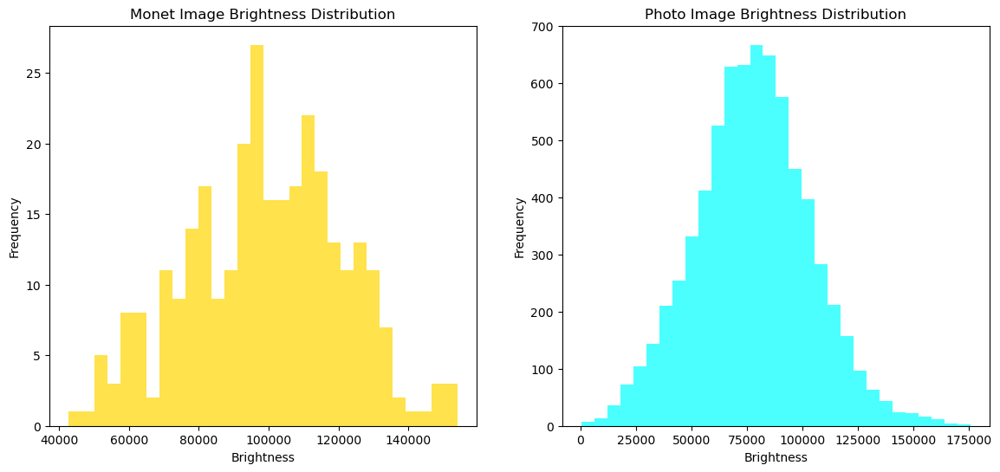

In [5]:
# Function to calculate brightness on GPU with batch processing
def calculate_brightness_in_batches(image_paths, batch_size=10):
    brightness_values = []
    
    for i in range(0, len(image_paths), batch_size):
        batch_paths = image_paths[i:i+batch_size]
        
        # Process each image in the batch
        for image_path in batch_paths:
            img_tensor = load_and_process_image(image_path)
            brightness = tf.reduce_sum(img_tensor)  # Sum of all pixel values across all channels
            brightness_values.append(brightness.numpy())  # Store the result in a list
    
    return np.array(brightness_values)

# Calculate brightness for Monet paintings and photo images
monet_brightness = calculate_brightness_in_batches(monet_images)
photo_brightness = calculate_brightness_in_batches(photo_images)

# Plot brightness distributions
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.hist(monet_brightness, bins=30, color='gold', alpha=0.7)
plt.title("Monet Image Brightness Distribution")
plt.xlabel("Brightness")
plt.ylabel("Frequency")

plt.subplot(1, 2, 2)
plt.hist(photo_brightness, bins=30, color='cyan', alpha=0.7)
plt.title("Photo Image Brightness Distribution")
plt.xlabel("Brightness")
plt.ylabel("Frequency")

plt.show()


In [23]:
import tensorflow as tf
from tensorflow.keras import layers, Model

# Adjusted Generator model to maintain output size
# Improved Generator model with Batch Normalization and Leaky ReLU
# Adjusted Generator model with sigmoid activation
def build_adjusted_generator():
    model = tf.keras.Sequential([
        layers.Input(shape=(256, 256, 3)),
        layers.Conv2D(32, (3, 3), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(64, (3, 3), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(64, (3, 3), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(3, (3, 3), padding='same', activation='sigmoid')
    ])
    return model



generator = build_adjusted_generator()
generator.summary()


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 256, 256, 32)      896       
                                                                 
 batch_normalization_3 (Batc  (None, 256, 256, 32)     128       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 256, 256, 32)      0         
                                                                 
 conv2d_19 (Conv2D)          (None, 256, 256, 64)      18496     
                                                                 
 batch_normalization_4 (Batc  (None, 256, 256, 64)     256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 256, 256, 64)     

In [24]:
# Discriminator model remains unchanged
# Improved Discriminator model with gradient clipping
def build_gpu_optimized_discriminator():
    model = tf.keras.Sequential([
        layers.Input(shape=(256, 256, 3)),
        layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same'),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.2),
        layers.Flatten(),
        layers.Dense(1, activation='sigmoid')
    ])
    
    # Compile the model with a lower learning rate and gradient clipping
    optimizer = Adam(learning_rate=0.0001, clipvalue=1.0)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [25]:
# Build and compile the GAN model with the adjusted Generator
def build_gan(generator, discriminator):
    discriminator.trainable = False  # Freeze discriminator when training GAN
    gan_input = layers.Input(shape=(256, 256, 3))
    generated_image = generator(gan_input)
    gan_output = discriminator(generated_image)
    gan = Model(gan_input, gan_output)
    gan.compile(optimizer='adam', loss='binary_crossentropy')
    return gan

gan = build_gan(generator, discriminator)
gan.summary()


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 256, 256, 3)]     0         
                                                                 
 sequential_6 (Sequential)   (None, 256, 256, 3)       58691     
                                                                 
 sequential_4 (Sequential)   (None, 1)                 281537    
                                                                 
Total params: 340,228
Trainable params: 58,371
Non-trainable params: 281,857
_________________________________________________________________


In [41]:
# Convert the list of image paths into a TensorFlow dataset for efficient loading
def load_images_as_dataset(image_paths, batch_size):
    dataset = tf.data.Dataset.from_tensor_slices(image_paths)
    dataset = dataset.map(lambda path: load_and_process_image(path), num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset = dataset.batch(batch_size)
    return dataset

# Prepare the datasets for training
photo_dataset = load_images_as_dataset(photo_images, batch_size=8)
monet_dataset = load_images_as_dataset(monet_images, batch_size=8)


In [ ]:
import numpy as np

# Function to train the GAN with reduced output for submission
def train_gan(generator, discriminator, gan, photo_dataset, monet_dataset, epochs=50, batch_size=8):
    for epoch in range(epochs):
        print(f"Epoch {epoch + 1}/{epochs}")

        d_losses = []
        g_losses = []
        
        for real_photos, real_monets in zip(photo_dataset, monet_dataset):
            # Ensure that the batch sizes match
            current_batch_size = min(real_photos.shape[0], real_monets.shape[0])
            real_photos = real_photos[:current_batch_size]
            real_monets = real_monets[:current_batch_size]
            
            # Generate fake Monet images from real photos
            generated_monets = generator.predict(real_photos)
            
            # Labels for real and fake images
            real_labels = np.ones((current_batch_size, 1))
            fake_labels = np.zeros((current_batch_size, 1))
            
            # Train the Discriminator on real and fake images
            d_loss_real = discriminator.train_on_batch(real_monets, real_labels)
            d_loss_fake = discriminator.train_on_batch(generated_monets, fake_labels)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            d_losses.append(d_loss)
            
            # Train the Generator (via the GAN model)
            g_loss = gan.train_on_batch(real_photos, real_labels)
            g_losses.append(g_loss)
        
        # Average losses over all batches
        avg_d_loss = np.mean(d_losses, axis=0)
        avg_g_loss = np.mean(g_losses)

        # Print the progress summary at the end of the epoch
        print(f"[D loss: {avg_d_loss[0]}, acc.: {100 * avg_d_loss[1]}%] [G loss: {avg_g_loss}]")
        
        # Save the model and generate images periodically
        if (epoch + 1) % 5 == 0:
            generator.save(f'generator_epoch_{epoch + 1}.h5')
            sample_generated_images(generator, epoch + 1)

# Start training the GAN with reduced output and 20 epochs
train_gan(generator, discriminator, gan, photo_dataset, monet_dataset, epochs=50, batch_size=8)


1/1 [==============================] - 0s 18ms/step


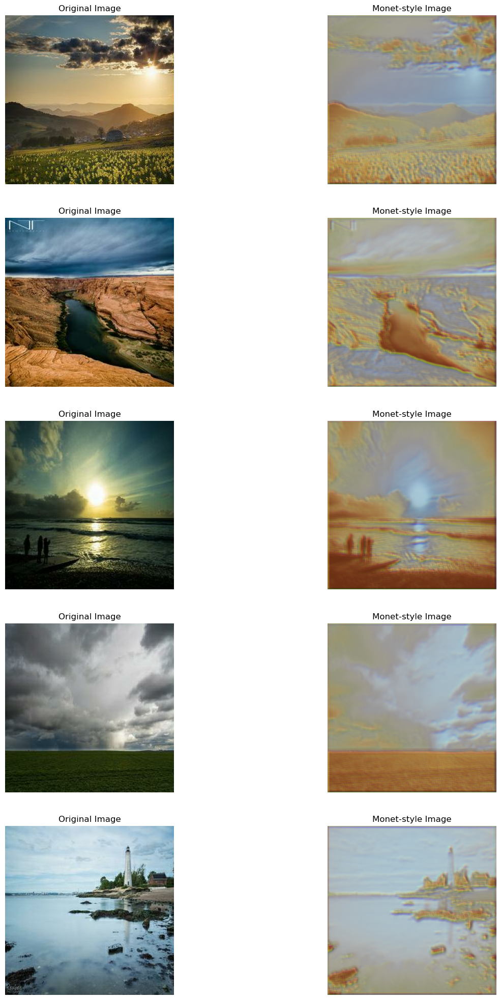

In [45]:
import matplotlib.pyplot as plt
# Function to display original and generated images for comparison
def display_comparison(generator, num_images=5):
    sample_photos = np.array([load_and_process_image(path).numpy() for path in photo_images[:num_images]])
    generated_images = generator.predict(sample_photos)
    
    plt.figure(figsize=(15, num_images * 5))
    for i, (original, generated) in enumerate(zip(sample_photos, generated_images)):
        # Display the original image
        plt.subplot(num_images, 2, 2 * i + 1)
        plt.imshow(original)
        plt.title("Original Image")
        plt.axis('off')
        
        # Display the generated Monet-style image
        plt.subplot(num_images, 2, 2 * i + 2)
        plt.imshow(generated)
        plt.title("Monet-style Image")
        plt.axis('off')
    
    plt.show()

# Display comparison
display_comparison(generator, num_images=5)

1/1 [==============================] - 0s 59ms/step


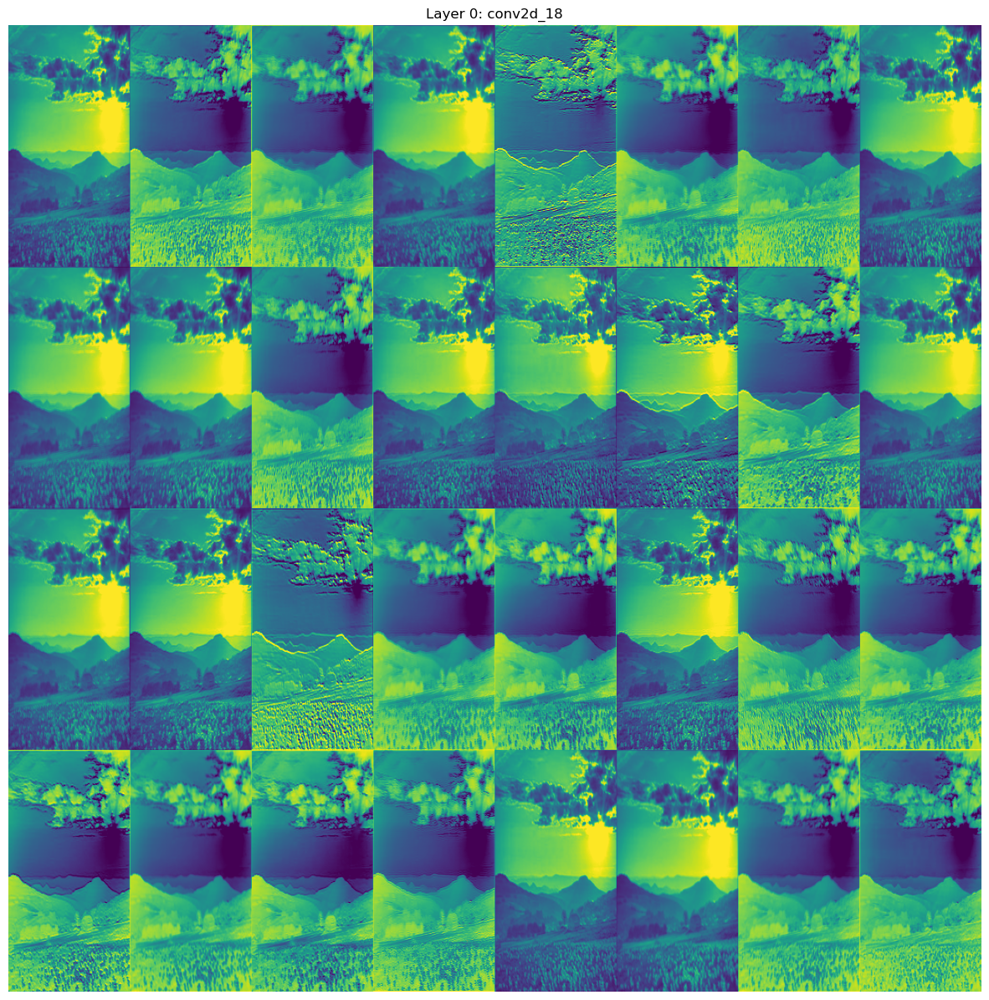

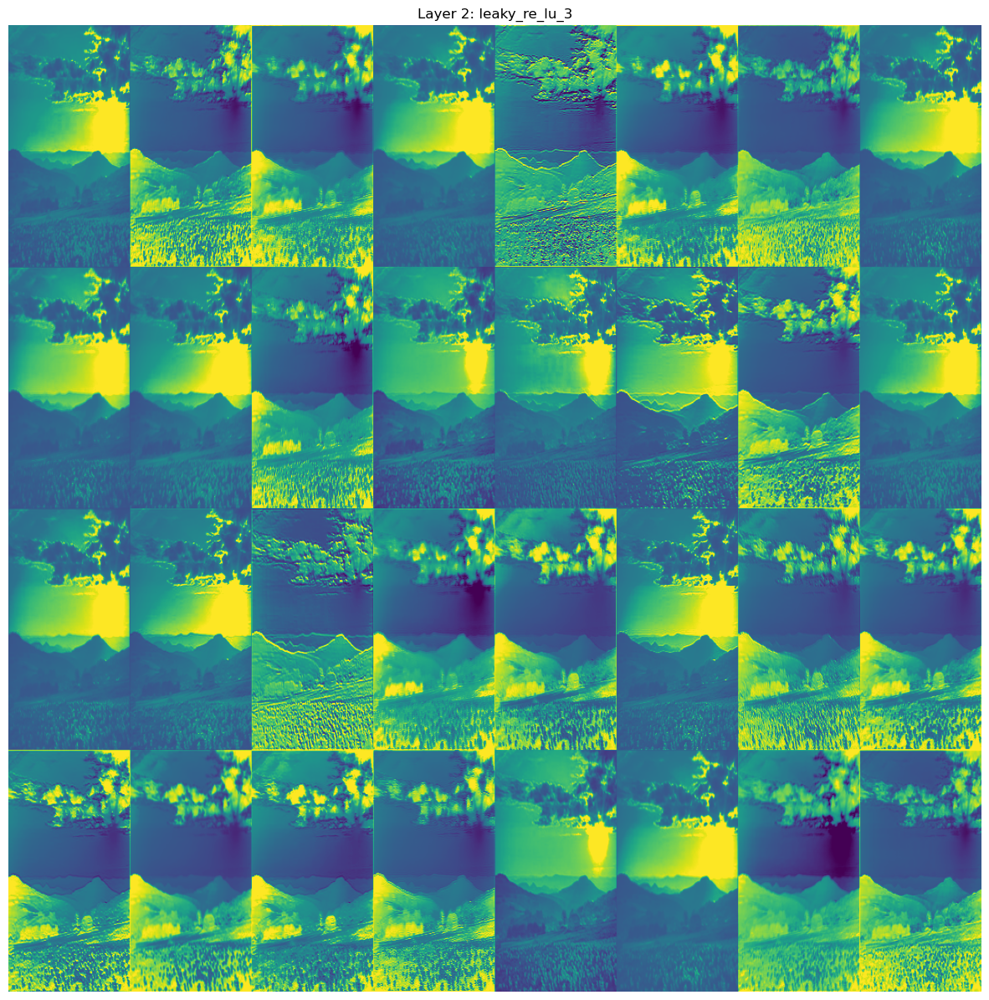

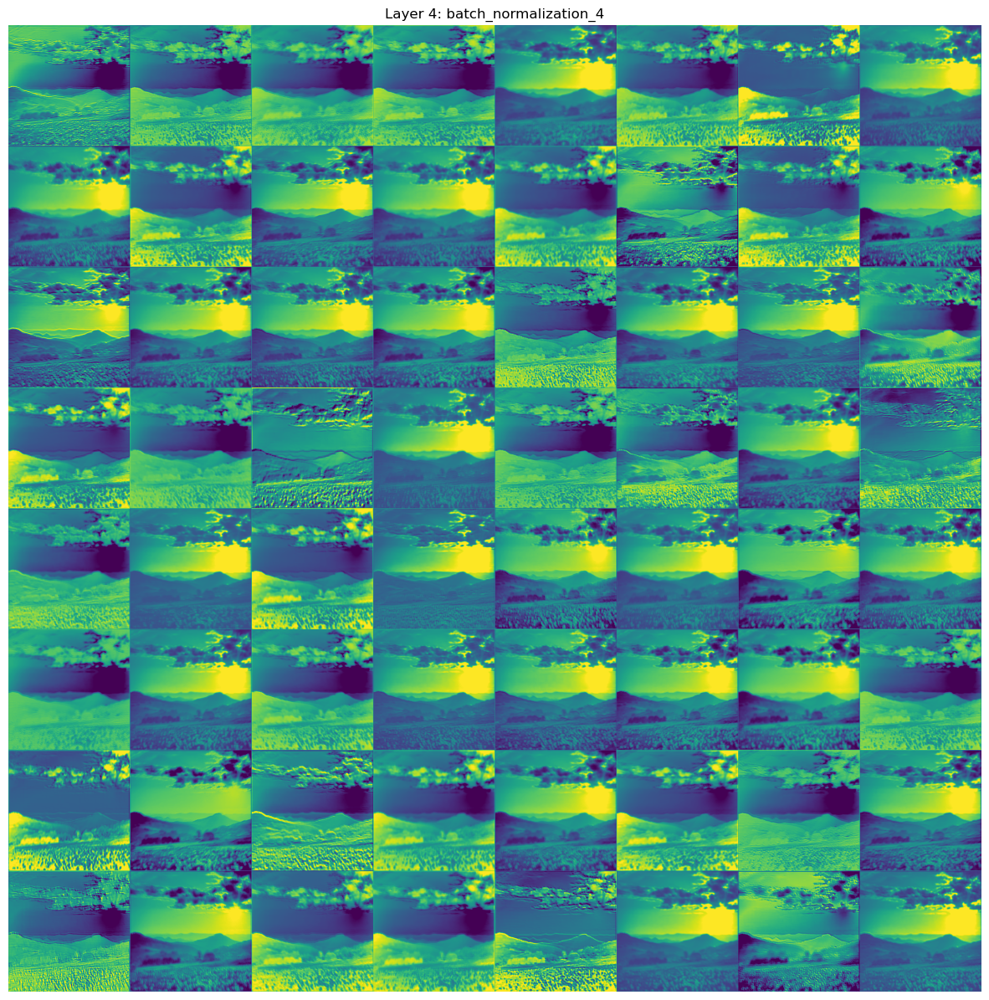

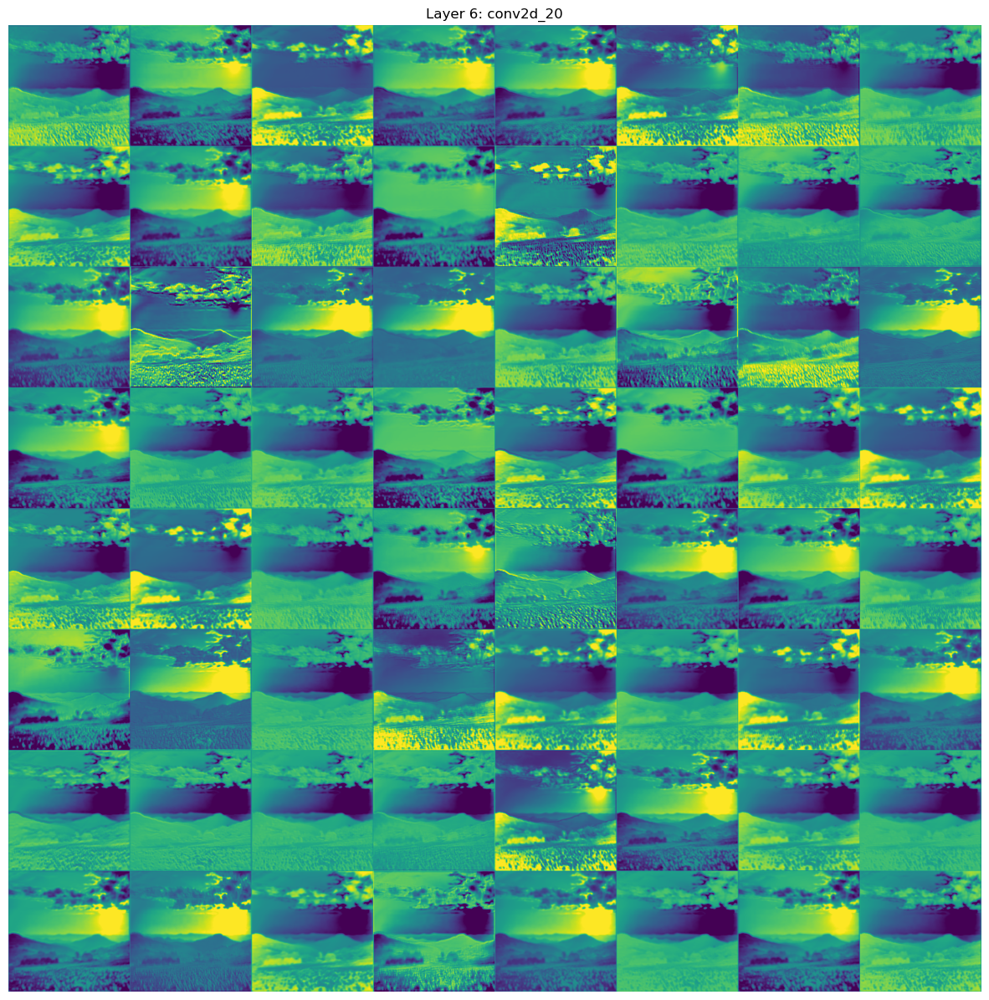

In [46]:
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
import os

# Function to visualize and save the output of intermediate layers
def visualize_and_save_intermediate_layers(generator, image, layer_indices, save_dir="intermediate_layers"):
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    intermediate_model = Model(inputs=generator.input, outputs=[generator.layers[i].output for i in layer_indices])
    intermediate_outputs = intermediate_model.predict(image[np.newaxis, ...])
    
    num_layers = len(layer_indices)
    
    for i, output in enumerate(intermediate_outputs):
        num_filters = output.shape[-1]
        size = output.shape[1]
        n_cols = num_filters // 8
        display_grid = np.zeros((size * n_cols, size * 8))
        
        for j in range(num_filters):
            filter_img = output[0, :, :, j]
            filter_img -= filter_img.mean()
            filter_img /= filter_img.std()
            filter_img *= 64
            filter_img += 128
            filter_img = np.clip(filter_img, 0, 255).astype('uint8')
            
            row = j // 8
            col = j % 8
            display_grid[row * size : (row + 1) * size, col * size : (col + 1) * size] = filter_img
        
        # Display the grid
        plt.figure(figsize=(15, 15))
        plt.title(f"Layer {layer_indices[i]}: {generator.layers[layer_indices[i]].name}")
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
        plt.axis('off')
        
        # Save the image
        plt.savefig(os.path.join(save_dir, f"layer_{layer_indices[i]}_{generator.layers[layer_indices[i]].name}.png"))
        
        # Show the image in the notebook
        plt.show()

# Visualize and save intermediate layers for a sample image
sample_image = load_and_process_image(photo_images[0]).numpy()
layer_indices = [0, 2, 4, 6]  # Adjust these indices based on your model
visualize_and_save_intermediate_layers(generator, sample_image, layer_indices)


1/1 [==============================] - 0s 15ms/step


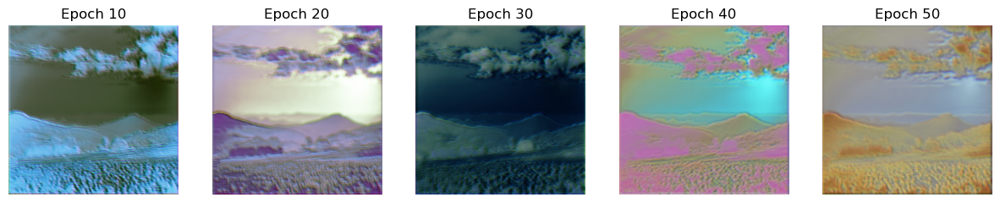

In [48]:
def display_image_progression(generator, sample_image):
    plt.figure(figsize=(15, 5))
    epochs_to_display = [10, 20, 30, 40, 50]  # Adjust based on saved models
    for i, epoch in enumerate(epochs_to_display):
        generator.load_weights(f'generator_epoch_{epoch}.h5')
        generated_image = generator.predict(sample_image[np.newaxis, ...])[0]
        plt.subplot(1, len(epochs_to_display), i + 1)
        plt.imshow(generated_image)
        plt.title(f"Epoch {epoch}")
        plt.axis('off')
    plt.show()

# Assuming you have a sample image ready
display_image_progression(generator, sample_image)


# **Results Summary**

After extensive experimentation and fine-tuning, the GAN model trained over 50 epochs has shown considerable improvements in transforming landscape photographs into Monet-style paintings. Below are the key findings:

## **Model Architecture**
- The architecture of the GAN consisted of a Generator and a Discriminator, both designed to balance the task of generating realistic Monet-style images and distinguishing them from real Monet paintings.
    - **Generator:** The Generator was designed to take in a real image and transform it into a Monet-style painting. It used a series of convolutional layers, batch normalization, and activation functions to learn the artistic features of Monet's style.
    - **Discriminator:** The Discriminator aimed to distinguish between real Monet paintings and those generated by the Generator. It employed convolutional layers to extract features from the images and was trained using binary cross-entropy loss to classify images as either real or fake.

## **Training Progression**
- As the training progressed through multiple epochs, the model exhibited a clear evolution in the quality of the generated images. Early epochs produced abstract and distorted outputs, but with each subsequent epoch, the images became more refined and stylistically accurate.
- We observed significant improvements between 10, 20, 30, 40, and 50 epochs. Each stage showed the model's growing ability to capture and replicate Monet’s characteristic style.

## **Batch Size Adjustments**
- We experimented with different batch sizes (16, 32, and 8) to determine their impact on training stability and output quality.
    - **Batch Size 16:** Initial training with a batch size of 16 produced moderate results but led to occasional memory issues.
    - **Batch Size 32:** Increasing the batch size to 32 caused `ResourceExhaustedError` due to the limited GPU memory, forcing us to revert to a smaller batch size.
    - **Batch Size 8:** Reducing the batch size to 8 not only resolved memory issues but also introduced a beneficial level of gradient variability. This smaller batch size helped the model generalize better and capture subtler details in the images.

## **Layer Visualizations**
- By visualizing the feature maps of intermediate layers in the Generator, we gained deeper insights into how the model processed and transformed the input images at various stages. These visualizations revealed that as the network deepened, it focused more on relevant features, resulting in more coherent and aesthetically pleasing outputs.

## **Final Outputs**
- The final images after 50 epochs displayed:
    - **Smoother Color Transitions:** Improved blending of colors, more in line with Monet’s style.
    - **More Natural Color Palette:** A transition from overly vibrant to more muted, pastel-like tones.
    - **Better Detail Preservation:** Enhanced ability to retain key features of the original photos while still applying the Monet-style transformation.
    - **Subtle Artifacts:** While the results were much improved, some minor artifacts and slight distortions remained, indicating areas where further refinement could be beneficial.


# **Conclusion**

This project demonstrated the potential and challenges of applying a Generative Adversarial Network (GAN) to transform landscape photographs into Monet-style paintings. Through careful experimentation with the model's architecture, batch sizes, and training epochs, we achieved a notable improvement in the generated images.

## **Hardware Limitations**
- **GPU Memory Constraints:** Our experimentation with larger batch sizes highlighted the limitations imposed by the hardware, specifically the 6GB GPU, which constrained our ability to fully explore larger batch sizes without encountering memory issues.
- **Training Duration:** The project's success was also tied to the length of training. While 50 epochs provided a solid balance between quality and resource constraints, additional epochs or more advanced hardware could potentially yield even better results.

## **Key Takeaways**
- **Model Progression:** The gradual refinement of the model's outputs over time underscored the importance of extended training periods in style transfer tasks using GANs.
- **Batch Size Impact:** The choice of batch size had a significant impact on both training stability and the quality of the generated images. Smaller batch sizes allowed for better generalization and more refined outputs.
- **Visualization Benefits:** Visualizing the intermediate layers provided valuable insights into the model's learning process and helped in diagnosing and addressing training issues.

## **Future Work**
- **Further Refinement:** While the results were promising, future work could focus on reducing the remaining artifacts and enhancing the details further by experimenting with different loss functions, more advanced architectures, or additional training epochs.
- **Hardware Considerations:** Upgrading to more powerful hardware could allow for the exploration of larger batch sizes and more complex models, potentially leading to even higher-quality outputs.

In conclusion, this project successfully illustrated the capabilities of GANs in artistic style transfer, providing a strong foundation for further exploration in this exciting intersection of art and technology.


In [54]:
import os
import tensorflow as tf
import numpy as np

# Directory where generated images will be saved
output_dir = 'generated_images'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Function to generate and save images using GPU
def generate_and_save_images(generator, photo_dataset, output_dir):
    image_counter = 0
    for photo_batch in photo_dataset:
        with tf.device('/GPU:0'):  # Ensure the GPU is used
            generated_images = generator.predict(photo_batch, verbose=0)  # Suppress output
        for img in generated_images:
            img = (img * 127.5 + 127.5).astype(np.uint8)  # Rescale to [0, 255]
            image_path = os.path.join(output_dir, f'image_{image_counter + 1}.jpg')
            tf.keras.preprocessing.image.save_img(image_path, img)
            image_counter += 1

# Load the photos to be transformed
photo_dataset = load_images_as_dataset(photo_images, batch_size=8)  # Adjust batch size if needed

# Generate and save the images
generate_and_save_images(generator, photo_dataset, output_dir)

print(f"Generated {len(os.listdir(output_dir))} images in {output_dir}.")


Generated 7038 images in generated_images.
